# $\ell_2$ distance approach

We would like to see how well we can classify activities by simply using $\ell_2$ distance between the feature vectors. To do so, we are going to
* Import the entire dataset,
* Fix one subject,
* Compute pairwise $\ell_2$ distance between the feature vectors along with MDS plot,
* Validate approach via NN classifer accuracy score.
* Validate approach with k-fold Cross Validation.

Let's import the necessary modules and the dataset.

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
from sklearn.manifold import MDS
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, cross_val_score,StratifiedKFold
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

uci_test = pd.read_csv('./Data/UCI HAR Data Frame/uci_test.csv')
uci_train = pd.read_csv('./Data/UCI HAR Data Frame/uci_train.csv')
uci_df = pd.concat([uci_train,uci_test],ignore_index = True)

uci_df

,subject,activity,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,...,fBodyBodyGyroJerkMag-meanFreq(),fBodyBodyGyroJerkMag-skewness(),fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)"
0,1,STANDING,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,...,-0.074323,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627
1,1,STANDING,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,...,0.158075,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317
2,1,STANDING,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,...,0.414503,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118
3,1,STANDING,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,...,0.404573,-0.117290,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663
4,1,STANDING,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,...,0.087753,-0.351471,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10294,24,WALKING_UPSTAIRS,0.310155,-0.053391,-0.099109,-0.287866,-0.140589,-0.215088,-0.356083,-0.148775,...,0.074472,-0.376278,-0.750809,-0.337422,0.346295,0.884904,-0.698885,-0.651732,0.274627,0.184784
10295,24,WALKING_UPSTAIRS,0.363385,-0.039214,-0.105915,-0.305388,0.028148,-0.196373,-0.373540,-0.030036,...,0.101859,-0.320418,-0.700274,-0.736701,-0.372889,-0.657421,0.322549,-0.655181,0.273578,0.182412
10296,24,WALKING_UPSTAIRS,0.349966,0.030077,-0.115788,-0.329638,-0.042143,-0.250181,-0.388017,-0.133257,...,-0.066249,-0.118854,-0.467179,-0.181560,0.088574,0.696663,0.363139,-0.655357,0.274479,0.181184
10297,24,WALKING_UPSTAIRS,0.237594,0.018467,-0.096499,-0.323114,-0.229775,-0.207574,-0.392380,-0.279610,...,-0.046467,-0.205445,-0.617737,0.444558,-0.819188,0.929294,-0.008398,-0.659719,0.264782,0.187563


# Data from one subject
Here validate working with a random subject:

We will subsample the dataset by fixing a subject. The idea is to test and see how well we can distinguish different activities of the subject by comparing $\ell_2$ distances between the feature vectors.

In [2]:
subject_index = 1 # choose subject
row_mask = uci_df["subject"] == subject_index
one_subject_df = uci_df[row_mask]
one_subject_df

,subject,activity,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,...,fBodyBodyGyroJerkMag-meanFreq(),fBodyBodyGyroJerkMag-skewness(),fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)"
0,1,STANDING,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,...,-0.074323,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627
1,1,STANDING,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,...,0.158075,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317
2,1,STANDING,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,...,0.414503,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118
3,1,STANDING,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,...,0.404573,-0.117290,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663
4,1,STANDING,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,...,0.087753,-0.351471,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
342,1,WALKING_DOWNSTAIRS,0.259949,-0.022680,-0.102276,-0.005766,0.092542,-0.253922,-0.089790,0.047677,...,0.152071,-0.324580,-0.722046,0.400129,0.832624,0.927989,-0.927624,-0.701330,0.287767,0.100701
343,1,WALKING_DOWNSTAIRS,0.203828,-0.000172,-0.083073,0.017822,0.042602,-0.158284,-0.062599,-0.008574,...,0.053816,-0.434320,-0.814774,0.754965,-0.161119,0.670040,0.118275,-0.696840,0.289860,0.103662
344,1,WALKING_DOWNSTAIRS,0.185946,-0.011804,-0.036140,-0.008068,-0.095223,-0.113690,-0.122857,-0.158982,...,0.055440,-0.462407,-0.815341,0.506709,-0.802412,0.641645,0.027721,-0.699930,0.289239,0.099656
345,1,WALKING_DOWNSTAIRS,0.335847,0.011446,-0.080037,0.006636,-0.271342,-0.129755,-0.104218,-0.268287,...,0.214442,-0.379227,-0.764880,-0.201566,0.208418,-0.797003,-0.376649,-0.718412,0.282839,0.080207


We extract the feature vectors and prepare labels.

In [3]:
one_subject_df_feature_vectors = one_subject_df.iloc[:,2:]
# labels = [one_subject_df.iloc[i]['activity'] for i in range(len(one_subject_df))]
labels = one_subject_df['activity'].tolist() # list of activity labels as strings.

In [4]:
one_subject_df_feature_vectors

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-meanFreq(),fBodyBodyGyroJerkMag-skewness(),fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)"
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.074323,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,0.158075,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,0.414503,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,0.404573,-0.117290,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,0.087753,-0.351471,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
342,0.259949,-0.022680,-0.102276,-0.005766,0.092542,-0.253922,-0.089790,0.047677,-0.260533,0.471498,...,0.152071,-0.324580,-0.722046,0.400129,0.832624,0.927989,-0.927624,-0.701330,0.287767,0.100701
343,0.203828,-0.000172,-0.083073,0.017822,0.042602,-0.158284,-0.062599,-0.008574,-0.153878,0.471498,...,0.053816,-0.434320,-0.814774,0.754965,-0.161119,0.670040,0.118275,-0.696840,0.289860,0.103662
344,0.185946,-0.011804,-0.036140,-0.008068,-0.095223,-0.113690,-0.122857,-0.158982,-0.143389,0.353499,...,0.055440,-0.462407,-0.815341,0.506709,-0.802412,0.641645,0.027721,-0.699930,0.289239,0.099656
345,0.335847,0.011446,-0.080037,0.006636,-0.271342,-0.129755,-0.104218,-0.268287,-0.133661,0.465088,...,0.214442,-0.379227,-0.764880,-0.201566,0.208418,-0.797003,-0.376649,-0.718412,0.282839,0.080207


# $\ell_2$ Distance Approach

We now compute pairwise $\ell_2$ distances between the feature vectors.

In [5]:
import time
from tqdm import tqdm

In [6]:
%%time
def l2_dist(x,y):
    diff_vector = x - y
    return np.linalg.norm(x-y)

N = len(one_subject_df_feature_vectors)
dm = np.zeros((N,N))
np.fill_diagonal(dm,0)
for i in tqdm(range(N)):
    for j in range(1,N):
        x = one_subject_df_feature_vectors.iloc[i]
        y = one_subject_df_feature_vectors.iloc[j]
        dist = l2_dist(x,y)
        dm[i][j] = dist

dm += dm.T
        

100%|█████████████████████████████████████████| 347/347 [00:08<00:00, 41.93it/s]

CPU times: user 8.12 s, sys: 874 ms, total: 9 s
Wall time: 8.3 s


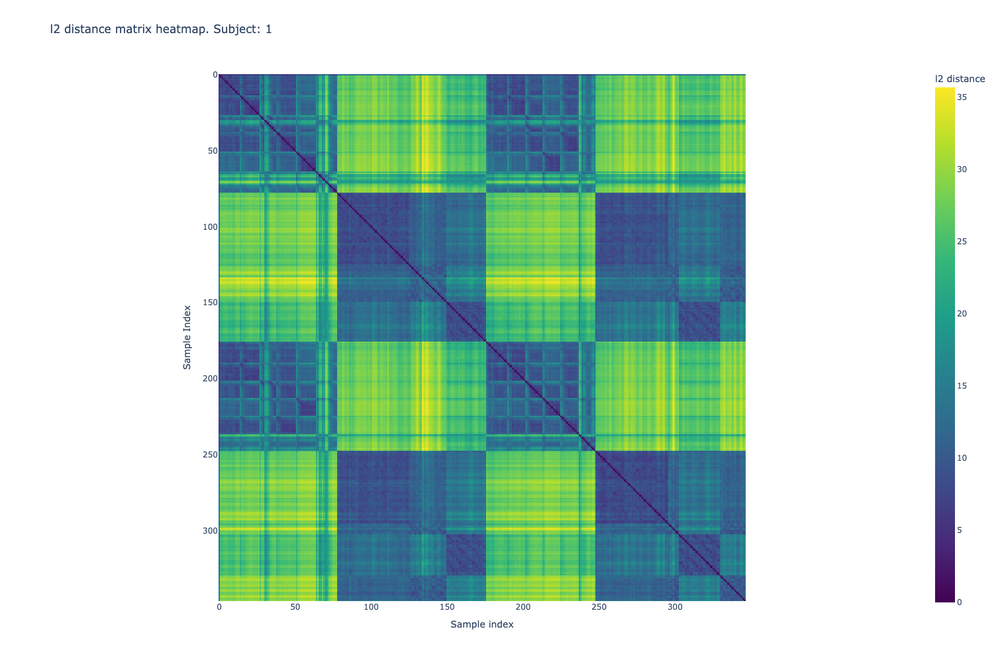

In [7]:
dm_df = pd.DataFrame(dm)

fig = px.imshow(dm_df,
                labels = dict( x = 'Sample index',y = 'Sample Index', color = 'l2 distance'),
                color_continuous_scale = 'Viridis',
                title = f'l2 distance matrix heatmap. Subject: {subject_index}'
               )

fig.update_layout(width = 1000,height = 1000)

fig.show()

# MDS Visualization of the $\ell_2$ distance matrix

We visualize the $\ell_2$ distance matrix with MDS in $\mathbb{R}^{3}$. It appears that there is a nice separation of activities, understood even from basic $\ell_2$ distance comparison.

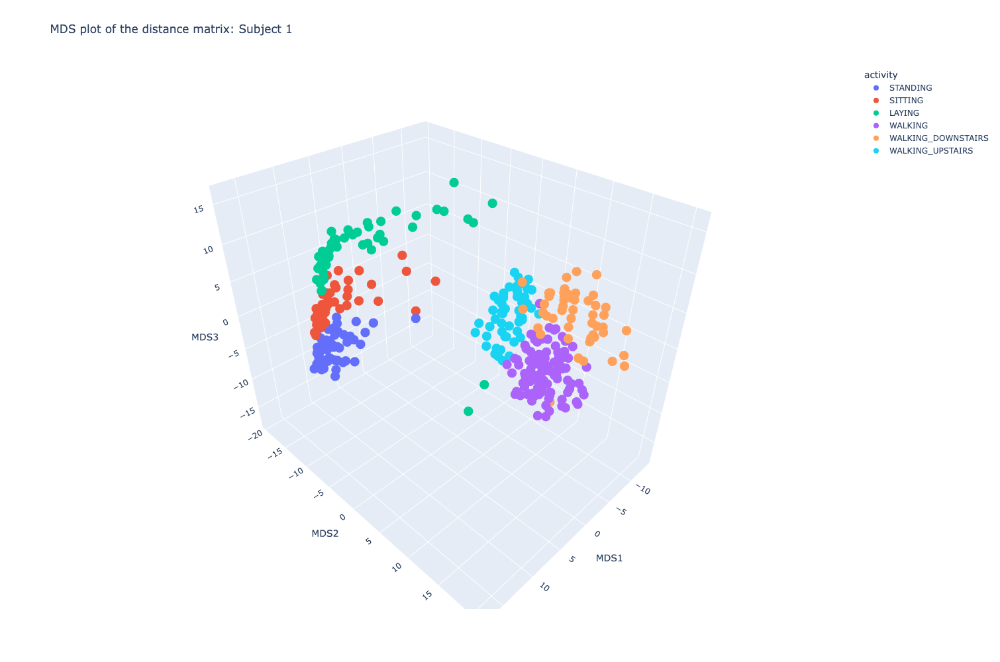

In [8]:
mds = MDS(n_components = 3,dissimilarity='precomputed',random_state = 42)
mds_coords = mds.fit_transform(dm)

mds_df = pd.DataFrame(mds_coords,columns = ['MDS1','MDS2','MDS3'])
mds_df['activity'] = labels

fig = px.scatter_3d(mds_df, x = 'MDS1', y = 'MDS2',z = 'MDS3',color = 'activity',
                   title = f'MDS plot of the distance matrix: Subject {subject_index}',
                   labels = {'color':'Activity'})

fig.update_layout(width = 1000,height = 1000)

fig.show()

# kNN Validation

We split the dataset (for the one subject) into train (70%) and testing sets (30%). For each sample in the testing set, we look at its $k$ nearest neighbors. The majority vote from these neighbors predict the class of our test sample. Accuracy score is given by
$$
\frac{\# \text{ Correct Predictions }}{\text{total} \# \text{ of samples}}
$$


It appears that our classifier does a perfect job with 100% accuracy.

In [10]:
# Encode labels
le = LabelEncoder()
y = le.fit_transform(labels)
n_samples = len(y)

# Train/test split (get indices only, don't split data directly)
indices = np.arange(n_samples)
train_idx, test_idx, y_train, y_test = train_test_split(indices, y, test_size=0.3, random_state=42)

# Extract the required submatrices for scikit-learn:
# D_train: distances between train samples
# D_test: distances from test samples to train samples
D_train = dm[np.ix_(train_idx, train_idx)]
D_test = dm[np.ix_(test_idx, train_idx)]

# Set up k-NN with precomputed distances
k = 3
knn = KNeighborsClassifier(n_neighbors=k, metric='precomputed')

# Fit using D_train (square, train-train distances)
knn.fit(D_train, y_train)

# Predict using D_test (rectangular, test-train distances)
y_pred = knn.predict(D_test)

# Evaluate
accuracy = np.mean(y_pred == y_test)
print(f"Accuracy: {accuracy:.2f}")


Accuracy: 1.00


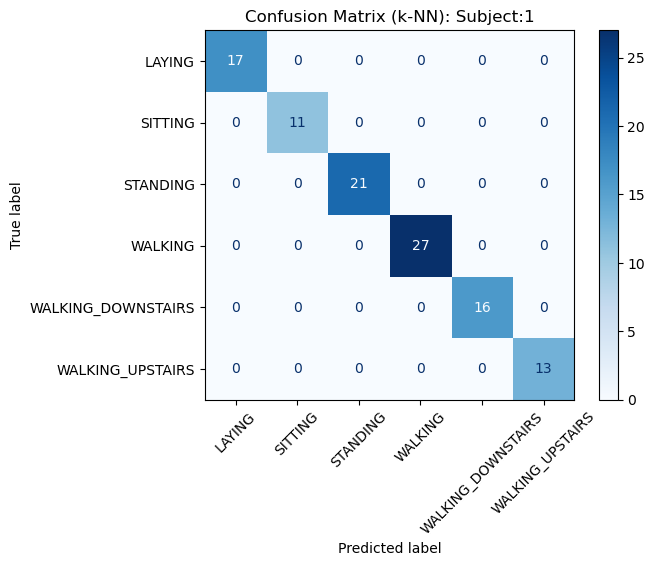

In [11]:
# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix with readable labels (optional but better)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=le.classes_)
disp.plot(cmap='Blues', xticks_rotation=45)

plt.title(f"Confusion Matrix (k-NN): Subject:{subject_index}")
plt.show()


# What about $\ell_\infty$ distance?

100%|█████████████████████████████████████████| 347/347 [00:08<00:00, 41.22it/s]


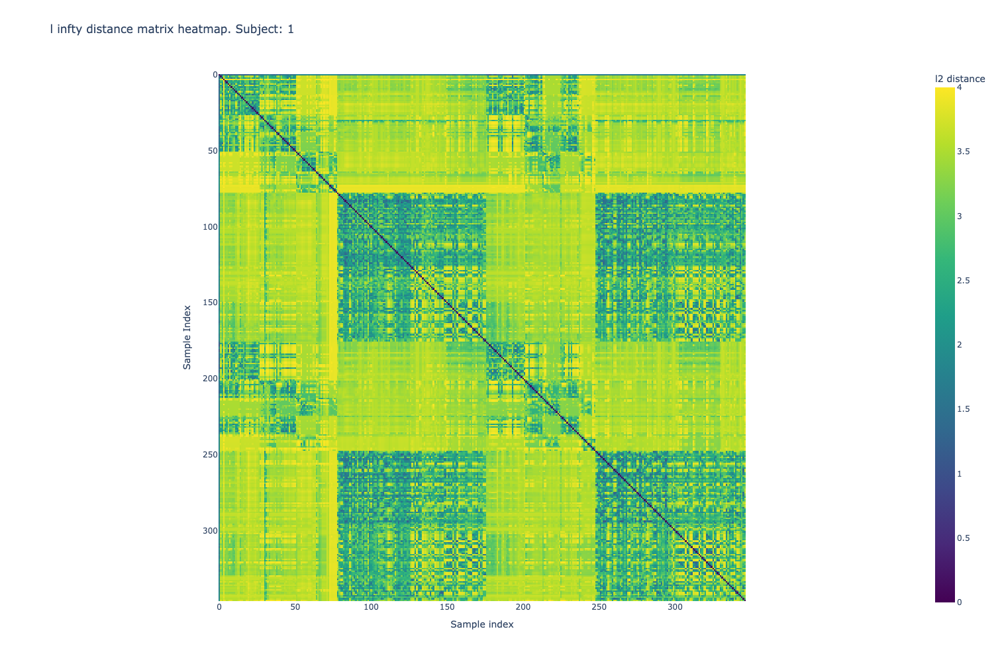

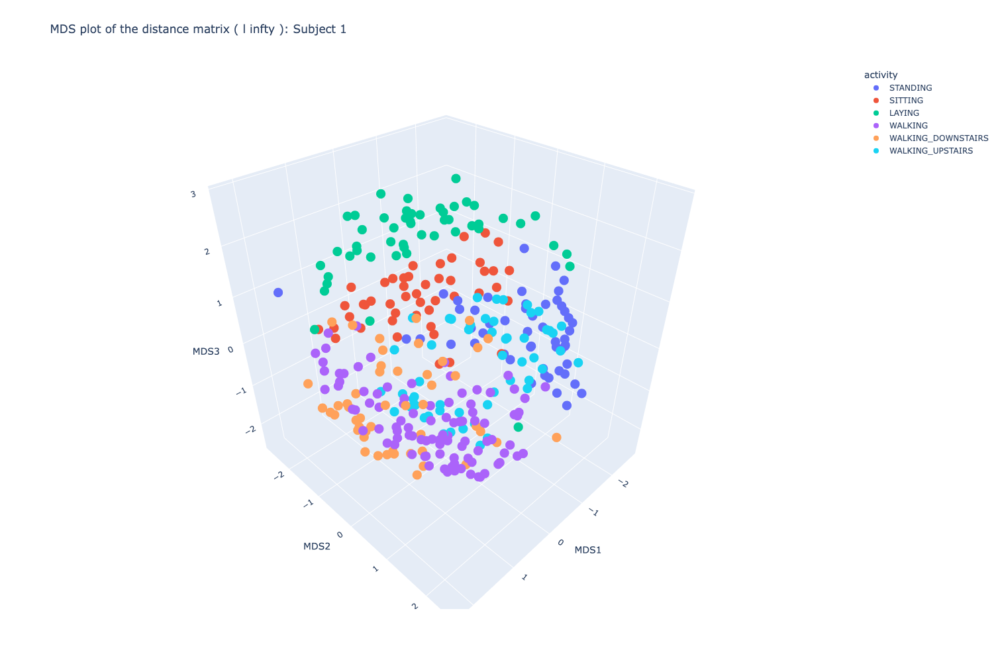

Accuracy: 0.80


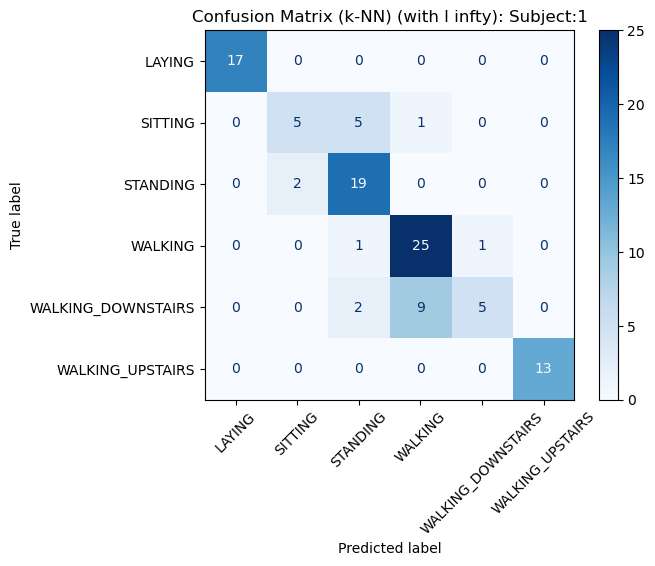

In [13]:
# == define l infinity distance
def l_infty(x,y):
    diff_vector = x - y
    return np.linalg.norm(x-y,np.inf)


# compute l infinity distance matrix
N = len(one_subject_df_feature_vectors)
dm_inf = np.zeros((N,N)) # distance matrix computed using l infinity distance
np.fill_diagonal(dm_inf,0)
for i in tqdm(range(N)):
    for j in range(1,N):
        x = one_subject_df_feature_vectors.iloc[i]
        y = one_subject_df_feature_vectors.iloc[j]
        dist = l_infty(x,y)
        dm_inf[i][j] = dist

dm_inf += dm_inf.T


# == plot heat map of dm_inf ====
dm_df_inf = pd.DataFrame(dm_inf)

fig = px.imshow(dm_df_inf,
                labels = dict( x = 'Sample index',y = 'Sample Index', color = 'l2 distance'),
                color_continuous_scale = 'Viridis',
                title = f'l infty distance matrix heatmap. Subject: {subject_index}'
               )

fig.update_layout(width = 1000,height = 1000)

fig.show()


# === plot MDS of dm_inf =====
mds = MDS(n_components = 3,dissimilarity='precomputed',random_state = 42)
mds_coords_inf = mds.fit_transform(dm_inf)

mds_df_inf = pd.DataFrame(mds_coords_inf,columns = ['MDS1','MDS2','MDS3'])
mds_df_inf['activity'] = labels

fig = px.scatter_3d(mds_df_inf, x = 'MDS1', y = 'MDS2',z = 'MDS3',color = 'activity',
                   title = f'MDS plot of the distance matrix ( l infty ): Subject {subject_index}',
                   labels = {'color':'Activity'})

fig.update_layout(width = 1000,height = 1000)

fig.show()


## ======== kNN using the dm_inf =========
# Convert string activity labels (e.g., 'WALKING', 'SITTING') into integer labels (e.g., 0, 1, 2)

# Encode labels
le = LabelEncoder()
y = le.fit_transform(labels)
n_samples = len(y)

# Train/test split (get indices only, don't split data directly)
indices = np.arange(n_samples)
train_idx, test_idx, y_train, y_test = train_test_split(indices, y, test_size=0.3, random_state=42)

# Extract the required submatrices for scikit-learn:
# D_train: distances between train samples
# D_test: distances from test samples to train samples
D_inf_train = dm_inf[np.ix_(train_idx, train_idx)]
D_inf_test = dm_inf[np.ix_(test_idx, train_idx)]

# Set up k-NN with precomputed distances
k = 3
knn = KNeighborsClassifier(n_neighbors=k, metric='precomputed')

# Fit using D_train (square, train-train distances)
knn.fit(D_inf_train, y_train)

# Predict using D_test (rectangular, test-train distances)
y_pred = knn.predict(D_inf_test)

# Evaluate
accuracy = np.mean(y_pred == y_test)
print(f"Accuracy: {accuracy:.2f}")

# === confusion matrix =====
# Generate confusion matrix
cm_inf = confusion_matrix(y_test, y_pred)

# Plot confusion matrix with readable labels (optional but better)
disp = ConfusionMatrixDisplay(confusion_matrix=cm_inf, display_labels=le.classes_)
disp.plot(cmap='Blues', xticks_rotation=45)

plt.title(f"Confusion Matrix (k-NN) (with l infty): Subject:{subject_index}")
plt.show()


# Make it more challenging

* The current data recordings were done with a fixed phone orientation. To be closer to reality, what would happen if the orientation was changed during each time-window? In other words is $\ell_2$ distance based approach invariant under orientation? I'm guessing the answer is no. Need to test this.

# Notes Jun 10:

* comparsion with the methods. have a baseline.
* simpler models sometimes better. can be used to argue.
* validate why you fix one subject. Given user data you can, person-specific.
* Try neural nets after shuffling.
* Write down notes as you work through. Bookkeeping.

